<div style="text-align:center;">
  <h1 style="font-size: 3em; margin-bottom: 0.2em;">Beyond the Numbers</h1>
  <h3 style="font-weight: 300; margin-top: 0;">Unlocking Insights Through Visualization</h3>
  <h4 style="font-size: 1.2em; margin-top: 2em;"><em>Derick Carlson – Data Tech 2025</em></h4>
</div>

* This is a dataset
* By just looking at it, what can you see?
* There are no column headers and no apparent patterns. Its a mess right?
* How many of you have been asked to make sense of a dataset like this?
* Today's topic is about taking data like this and making it readable to the human eye.
* Prepare to be amazed
* _Switch to RGB tab_
* YIKES that did not help.
* If we want to uncover the secrets of this dataset, we need to go "Beyond the Numbers"
* _zoom out_
* Now we understand the bigger **without** needing to know any of the individual values.
* _swap to title slide_


In [105]:
import plotly.figure_factory as ff
import numpy as np
import plotly.graph_objects as go
import pandas as pd
from perlin_noise import PerlinNoise
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from IPython.display import display
from scipy.stats import pearsonr


## Part 1: Some Data is Meant to be Seen

## Part 2: Converting data to visual information

## Part 3: Applied Knowlege

* In the next 25 minutes, we will cover 3 main topics.
* **Data that is meant to be seen**
* This first section explores insights hidden in plain sight.
* The second section will cover building visualization designed to explore and analyze data
* And finally we will apply what we've learned to a real world example

<div style="text-align:center;">
  <h1 style="font-size: 2em; margin-bottom: 0.2em;">Part 1: Some Data is Meant to be Seen</h1>
</div>

### The Path to Insight

In [46]:

# Define grid size
size = 50

# Initialize Perlin Noise
noise = PerlinNoise(octaves=4, seed=42)

# Generate elevation data using Perlin noise
elevation = np.zeros((size, size))
for i in range(size):
    for j in range(size):
        elevation[i, j] = noise([i / size, j / size])

# Normalize elevation values to range 0-100
elevation = (elevation - np.min(elevation)) / (np.max(elevation) - np.min(elevation)) * 100

# Convert to Pandas DataFrame for display
df = pd.DataFrame(elevation.round(1).astype(str))


### Display Raw Data

In [47]:
el_df = df.style.set_table_attributes("style='display:inline'").set_caption("Elevation Readings")

In [48]:
el_df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49
0,53.0,45.3,39.8,37.5,38.6,42.7,48.7,55.3,61.1,64.8,65.3,62.4,56.5,49.4,41.8,34.1,27.1,22.1,19.8,20.7,24.6,30.6,37.6,44.2,49.3,53.0,56.6,61.5,67.6,74.0,79.4,82.7,83.3,81.0,76.2,69.9,62.9,56.2,49.8,43.8,38.9,35.8,34.8,36.0,39.1,43.4,47.9,51.8,54.0,54.3
1,55.1,47.6,42.1,39.7,40.8,44.8,50.7,57.2,62.9,66.4,66.9,63.9,58.1,51.0,43.6,36.2,29.8,25.5,24.2,26.1,30.9,37.8,45.4,52.4,57.6,61.3,64.9,69.7,75.6,81.7,86.7,89.7,89.9,87.3,82.3,75.7,68.7,61.9,55.6,49.6,44.8,41.7,40.7,42.0,45.1,49.4,53.9,57.7,60.0,60.2
2,56.2,49.1,43.9,41.8,43.0,46.9,52.7,59.0,64.4,67.8,68.2,65.3,59.6,52.7,45.7,38.8,33.2,29.8,29.4,32.2,37.7,45.2,53.1,60.2,65.4,68.9,72.3,76.9,82.5,88.2,92.9,95.6,95.6,92.8,87.7,81.2,74.3,67.7,61.4,55.6,50.8,47.8,46.8,47.9,50.8,54.8,59.0,62.5,64.4,64.4
3,55.9,49.7,45.3,43.7,45.2,49.2,54.7,60.6,65.7,68.7,69.0,66.2,61.0,54.6,48.1,42.1,37.4,34.9,35.4,38.9,44.8,52.4,60.2,66.9,71.7,74.9,77.9,82.0,87.1,92.4,96.8,99.2,99.2,96.6,91.8,85.7,79.1,72.8,66.8,61.3,56.7,53.7,52.6,53.4,55.8,59.1,62.5,65.2,66.5,66.0
4,54.3,49.4,46.3,45.6,47.5,51.5,56.7,62.0,66.4,68.9,69.0,66.5,61.8,56.3,50.7,45.8,42.2,40.7,41.9,45.7,51.6,58.7,65.8,71.8,75.9,78.4,80.8,84.3,88.7,93.4,97.4,99.8,100.0,97.9,93.8,88.3,82.4,76.6,71.1,65.9,61.7,58.9,57.7,58.1,59.7,62.1,64.4,66.0,66.2,65.0
5,51.7,48.7,47.2,47.6,50.0,53.9,58.6,63.0,66.5,68.4,68.1,65.9,62.1,57.6,53.2,49.5,47.1,46.6,48.3,52.1,57.4,63.6,69.5,74.3,77.4,79.1,80.7,83.3,86.9,91.0,94.6,97.0,97.5,96.2,93.0,88.5,83.5,78.4,73.4,68.8,65.1,62.7,61.5,61.6,62.5,63.7,64.7,64.9,64.0,61.8
6,48.8,48.0,48.2,49.8,52.8,56.5,60.4,63.8,66.1,67.1,66.5,64.5,61.6,58.3,55.2,52.8,51.6,52.0,54.0,57.4,61.8,66.6,70.9,74.2,76.0,76.8,77.5,79.2,81.9,85.2,88.4,90.9,92.0,91.5,89.5,86.2,82.2,77.8,73.5,69.6,66.6,64.7,63.8,63.7,64.0,64.2,63.9,62.8,60.5,57.3
7,46.2,47.5,49.6,52.4,55.8,59.3,62.2,64.4,65.4,65.2,64.1,62.4,60.4,58.3,56.5,55.5,55.4,56.4,58.5,61.3,64.5,67.7,70.2,71.8,72.4,72.2,72.0,72.6,74.4,77.0,79.9,82.4,84.1,84.6,83.7,81.6,78.6,75.1,71.5,68.3,66.0,64.8,64.4,64.5,64.5,64.0,62.7,60.3,56.9,52.6
8,44.5,47.8,51.5,55.4,59.1,62.1,64.0,64.8,64.3,63.1,61.5,59.9,58.7,57.8,57.2,57.3,58.1,59.6,61.6,63.7,65.7,67.2,68.0,68.0,67.3,66.1,65.1,64.9,65.8,67.7,70.2,72.8,75.0,76.3,76.5,75.5,73.5,70.7,67.7,65.2,63.8,63.4,63.8,64.3,64.4,63.6,61.6,58.4,54.0,48.8
9,44.1,49.0,54.0,58.7,62.4,64.9,65.8,65.1,63.4,61.0,58.8,57.3,56.8,56.9,57.2,58.2,59.8,61.6,63.4,64.9,65.7,65.7,65.0,63.7,62.0,60.1,58.3,57.4,57.5,58.8,61.0,63.6,66.1,68.1,69.1,69.0,67.7,65.6,63.1,61.2,60.6,61.1,62.4,63.7,64.3,63.6,61.5,57.8,52.8,46.9


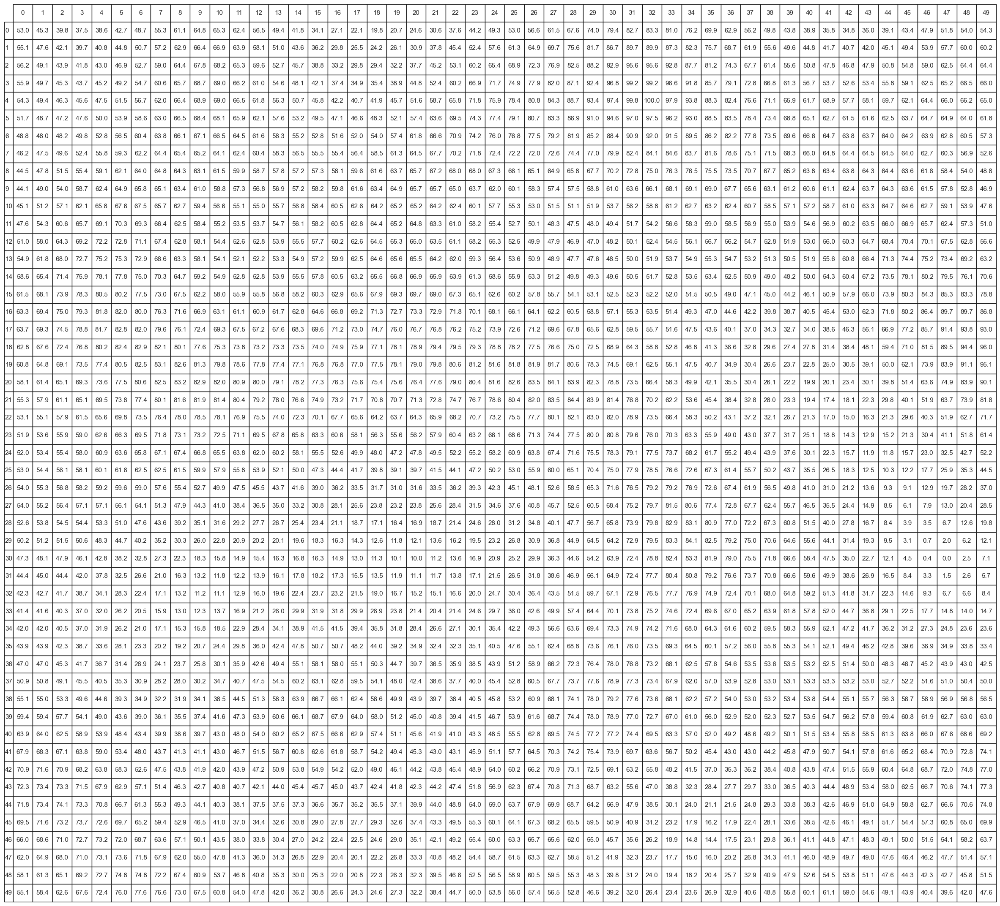

In [49]:
fig, ax = plt.subplots(figsize=(15, 25))
ax.axis("off")

table = ax.table(
    cellText=df.values,
    colLabels=df.columns,
    rowLabels=df.index,
    cellLoc="center",
    loc="center"
)
table.scale(2, 2.5)
table.set_fontsize(12)


* Here is another dataset,
_hit space bar_
* similar to the last one
* only this time, our goal goes beyond looking at handome pictures
* we are going to work this data until we have an actionable insight
* So, where should we start?
* _anyone have an opinion?  Should we scroll around and get a feel for it?_
* It's dimensions appear to be 50x50
* how bout a hint.  
* _select pen,_ 
* _hit "s" 2 times to make it red_
* At the top it says this is elevation data.
* A good place to start with this type of data is by arranging it appropriately into an x, y gird with the elevation value shown in each of the coordinate positions.

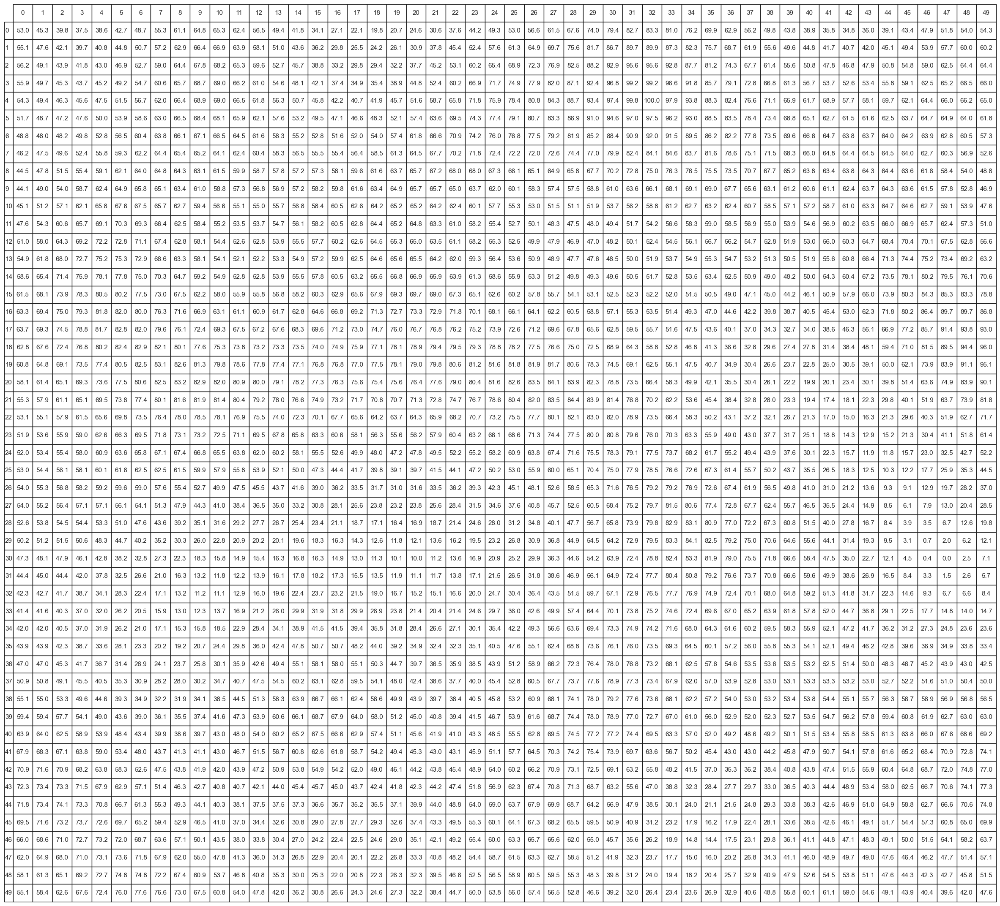

In [50]:
display(table.figure)

### Step 1

In [51]:
size = elevation.shape[0]

# Create the heat map in plotly
el = go.Figure(data=go.Heatmap(
    z=elevation,      # Elevation values
    x=np.linspace(0, size-1, size),  # X coordinates (0 to size-1)
    y=np.linspace(0, size-1, size),  # Y coordinates (0 to size-1)
    colorscale='greys'  # Use the 'viridis' color scale
))
# Update the layout with titles and labels
el.update_layout(
    title="Shaded Elevation",
    xaxis_title="X Coordinate",
    yaxis_title="Y Coordinate",
    coloraxis_colorbar=dict(
        title="Elevation"  # Color bar label
    ),
    width=900,
    height=720
)

# Show the plot
el.show()

* Like this:
* Even with every value present, organized correctly and knowledge of what it represents, we still come up empty .
* You can’t see slope.
* You can’t see shape.
* You certainly can’t plan a route.”
* “So let’s address this.
* watch what happens when we apply shading based on value.”

## Shading

In [52]:
el.show()

* This allows us to see the basic shape of the data.
* we can see hints of hills and valleys.
* I still don't consider this useful.
* at this point, you’d still be guessing.
* We need to take it a step further and encode it properly with Color, Contours, and Elevation lines.


### Now I see it

In [53]:

# Create the contour plot in plotly
con = go.Figure(data=go.Contour(
    z=elevation,      # Elevation values
    x=np.linspace(0, size-1, size),  # X coordinates (0 to size-1)
    y=np.linspace(0, size-1, size),  # Y coordinates (0 to size-1)
    colorscale='haline',  # Use the 'terrain' color scale
    contours=dict(
        start=elevation.min(),  # Set the starting level for contours
        end=elevation.max(),    # Set the ending level for contours
        size=(elevation.max() - elevation.min()) / 25  # Set the contour level spacing
    )
))

# Update the layout with titles and labels
con.update_layout(
    title="Countoured Elevation",
    xaxis_title="X Coordinate",
    yaxis_title="Y Coordinate",
    coloraxis_colorbar=dict(
        title="Elevation"  # Color bar label
    ),
    width=900,
    height=720
)



In [54]:
con.show()

* Same data. Same grid.
* But now it’s no longer abstract - it’s navigable.
* You can evaluate terrain and spot bottlenecks.
* You could pick a safe path from one side to the other.
* You went from passive recognition to confident navigation.
* That’s the shift visualization enables.
* *Next Slide*


<div style="text-align:center;">
  <h1 style="font-size: 1.5em; margin-bottom: 0.2em;">Man vs Machine</h1>
</div>

<img src="John_Henry.png" width="1000" style="display: block; margin-left: auto; margin-right: auto;"/>

* Who knows the legend of John Henry?
* _pause for audience reaction_
* In American folklore, John Henry worked on the railroad in the late 1800's.
* His job was to drive steel spikes with a hammer securing tracks to railroad ties.
* He was considered the best, _pause_
* until one day a steam drill entered the scene.
* Legend has it, John challenged the machine in a head to head steel driving extravaganza.
* They say he beat it, but lost his life in the process.
* That drill is now ancient techonology, but the metaphore lives on today.
* _next slide_

In [55]:
import heapq
import numpy as np
import plotly.graph_objects as go

# Define grid size and Perlin noise elevation data
size = 50
noise = PerlinNoise(octaves=4, seed=42)
elevation = np.zeros((size, size))

for i in range(size):
    for j in range(size):
        elevation[i, j] = noise([i / size, j / size])

elevation = (elevation - np.min(elevation)) / (np.max(elevation) - np.min(elevation)) * 100

# Define start and end points
start_x, start_y = 10, 0
end_x, end_y = 25, size - 1  # y=49 if size=50

# Heuristic function: Manhattan distance
def heuristic(x, y):
    return abs(x - end_x) + abs(y - end_y)

# A* algorithm
def a_star_search(start_x, start_y):
    open_set = []
    heapq.heappush(open_set, (0 + heuristic(start_x, start_y), start_x, start_y))  # (f_cost, x, y)
    
    came_from = {}
    g_costs = { (start_x, start_y): 0 }
    f_costs = { (start_x, start_y): heuristic(start_x, start_y) }

    path_x, path_y = [], []
    
    while open_set:
        _, current_x, current_y = heapq.heappop(open_set)

        # If we reached the destination, reconstruct the path
        if (current_x, current_y) == (end_x, end_y):
            while (current_x, current_y) in came_from:
                path_x.append(current_x)
                path_y.append(current_y)
                current_x, current_y = came_from[(current_x, current_y)]
            path_x.append(start_x)
            path_y.append(start_y)
            return path_x[::-1], path_y[::-1]  # Reverse path for correct order

        # Check all possible neighbors
        for dx, dy in [(-1, 0), (1, 0), (0, -1), (0, 1), (-1, -1), (1, 1), (-1, 1), (1, -1)]:
            neighbor_x, neighbor_y = current_x + dx, current_y + dy
            if 0 <= neighbor_x < size and 0 <= neighbor_y < size:
                tentative_g_cost = g_costs[(current_x, current_y)] + elevation[neighbor_y, neighbor_x]

                if (neighbor_x, neighbor_y) not in g_costs or tentative_g_cost < g_costs[(neighbor_x, neighbor_y)]:
                    came_from[(neighbor_x, neighbor_y)] = (current_x, current_y)
                    g_costs[(neighbor_x, neighbor_y)] = tentative_g_cost
                    f_costs[(neighbor_x, neighbor_y)] = tentative_g_cost + heuristic(neighbor_x, neighbor_y)
                    heapq.heappush(open_set, (f_costs[(neighbor_x, neighbor_y)], neighbor_x, neighbor_y))

    return [], []  # No path found (shouldn't happen with proper inputs)

# Get the path
path_x, path_y = a_star_search(start_x, start_y)

# Plot the contour map
AI = go.Figure()

# Add the contour plot (elevation map)
AI.add_trace(go.Contour(
    z=elevation,
    x=np.linspace(0, size - 1, size),
    y=np.linspace(0, size - 1, size),
    colorscale='haline',
    contours=dict(
        start=elevation.min(),
        end=elevation.max(),
        size=(elevation.max() - elevation.min()) / 25
    ),
    showscale=True,
    name='Elevation',
    visible=True  # <-- key: keep it always in the base layer
))

# Add visual cues for start and end points
AI.add_trace(go.Scatter(
    x=[start_x], y=[start_y],
    mode='markers',
    marker=dict(size=15, color='red', symbol='star'),
    name='Start Point'
))

AI.add_trace(go.Scatter(
    x=[end_x], y=[end_y],
    mode='markers',
    marker=dict(size=15, color='yellow', symbol='star'),
    name='End Point'
))

# Create animation for the pathfinding process
frames = []

# Add initial frame with only the start and end points visible
frames.append(go.Frame(
    data=[
        go.Scatter(x=[start_x], y=[start_y], mode='markers', marker=dict(size=15, color='red', symbol='star')),
        go.Scatter(x=[end_x], y=[end_y], mode='markers', marker=dict(size=15, color='yellow', symbol='star'))
    ],
    name='frame_0'
))

# Add frames to show each step of the pathfinding
for i in range(1, len(path_x) + 1):
    frames.append(go.Frame(
        data=[
            go.Contour(
                z=elevation,
                x=np.linspace(0, size-1, size),
                y=np.linspace(0, size-1, size),
                colorscale='haline',
                contours=dict(
                    start=elevation.min(),
                    end=elevation.max(),
                    size=(elevation.max() - elevation.min()) / 25
                ),
                showscale=True
            ),
            go.Scatter(
                x=path_x[:i], y=path_y[:i],
                mode='lines',
                line=dict(color='black', width=3),
                marker=dict(size=6, color='white'),
                name='Path (animated)'
            ),
            go.Scatter(
                x=[start_x], y=[start_y],
                mode='markers',
                marker=dict(size=15, color='red', symbol='star'),
                name='Start Point'
            ),
            go.Scatter(
                x=[end_x], y=[end_y],
                mode='markers',
                marker=dict(size=15, color='yellow', symbol='star'),
                name='End Point'
            )
        ],
        name=f'frame_{i}'
    ))

go.Contour(
    z=elevation,
    x=np.linspace(0, size-1, size),
    y=np.linspace(0, size-1, size),
    colorscale='haline',
    contours=dict(
        start=elevation.min(),
        end=elevation.max(),
        size=(elevation.max() - elevation.min()) / 25
    ))
# Set layout options
AI.update_layout(
    title="Topographic Map with Animated Path",
    xaxis_title="X Coordinate",
    yaxis_title="Y Coordinate",
    width=900,
    height=720,
    updatemenus=[dict(
        type='buttons',
        showactive=False,
        buttons=[dict(
            label='Play',
            method='animate',
            args=[None, dict(frame=dict(duration=100, redraw=True), fromcurrent=True)]
        )]
    )],
    # Move the color bar to avoid overlap
    coloraxis_colorbar=dict(
        title="Elevation", 
        x=1.05,  # Position the color bar to the right
        tickvals=[0, 25, 50, 75, 100]
    ),
    # Adjust the layout so that legend items don't overlap
    legend=dict(x=0.7, y=1, traceorder='normal', font=dict(size=12))
)

# Add frames to the figure
AI.frames = frames

# Show the plot
AI.show()

In [56]:
AI.show()

* So, in the spirit of John Henry, I will let the machines attempt to navigate our terrain map.
* Before we do, lets make our attemtp first.
* *open chalkboard "comma" and plot the path.*
* The goal is to get from the red star to the yellow star.
* If I am walking this, I think I want to stay on the high ground, and avoid steep terrain.
* That looks like a safe path.  
* It only took us a few seconds.  
* Lets see how the AI does.
* _click play_
* _wait for animation to complete and give the audience a second_
* Which path would you choose?
* Anyone keen to plummet 50 feet off of this cliff?
* _open the pen, show the cliff_
* I don't think we are ready to let our robot overlords make this decision for us yet.
* And that is the point.
* The numbers where there all along but they don't help us decide
* but, when properly visualized, most of us can see with our eyes what the algortym cannot.
* we can quickly identify the shape and solution without overcomplicating it.


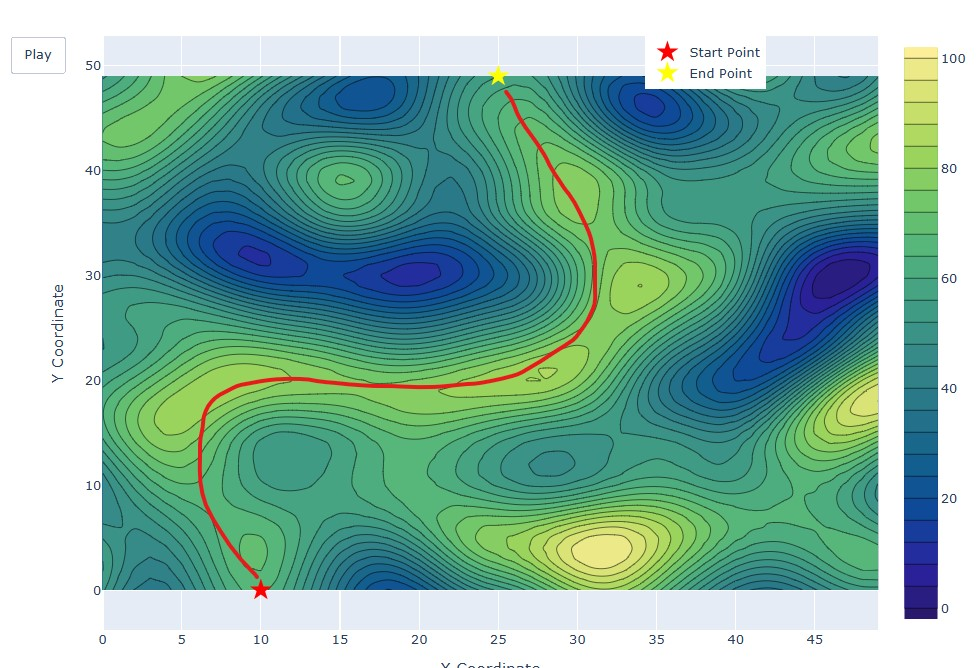

<div style="text-align:center;">
  <h1 style="font-size: 2em; margin-bottom: 0.2em;">Part 1: More Data is Meant to be Seen</h1>
</div>

### Anscombe's Quartet

* We all agree that some data isn't just easier to see, it **has to** be seen.
* Let me show you one more example.
* It is a classic, many of you may be familiar with,
* but still, it is wildly relevant. 

In [57]:
an = sns.load_dataset("anscombe")

In [58]:
# Create a dictionary of DataFrames for each dataset type
ans = {dataset: an[an['dataset'] == dataset].reset_index(drop=True).drop(columns=['dataset']) for dataset in an['dataset'].unique()}

# Concatenate the DataFrames along the columns
result = pd.concat(ans, axis=1)

# Flatten the MultiIndex columns
result.columns = [f'{col}' for col in result.columns]

In [59]:
def regression_formula(df):
    X = sm.add_constant(df['x'])
    model = sm.OLS(df['y'], X).fit()
    return model.params

In [60]:
regression_lines = an.groupby('dataset').apply(regression_formula).reset_index()
regression_lines.columns = ['dataset', 'intercept', 'slope']

C:\Users\M738081\AppData\Local\Temp\ipykernel_3044\2177288824.py:1: DeprecationWarning:

DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.



In [61]:
# Calculate measures of central tendency and regression line formula
summary_stats = an.groupby('dataset').agg({
    'x': ['mean', 'std'],
    'y': ['mean', 'std']
}).reset_index()

summary_stats.columns = ['dataset', 'mean_x', 'std_x', 'mean_y', 'std_y']
summary_stats = summary_stats.merge(regression_lines, on='dataset')

summary_stats = summary_stats.round(2)

In [62]:
stats = summary_stats.style.set_caption("Summary Statistics and Regression Line Coefficients by Dataset") \
    .set_table_attributes('style="width:100%; font-size:16px"') \
    .format(precision=2) \
    .set_table_styles([{
        'selector': 'caption',
        'props': [('caption-side', 'top'),
                  ('font-size', '18px'),
                  ('font-weight', 'bold')]
    }]) \
    .background_gradient(subset=['mean_x', 'mean_y'], cmap='Blues') \
    .background_gradient(subset=['std_x', 'std_y'], cmap='Oranges') \
    .background_gradient(subset=['slope', 'intercept'], cmap='Greens')

### Anscombe's Quartet

In [63]:
stats

,dataset,mean_x,std_x,mean_y,std_y,intercept,slope
0,I,9.00,3.32,7.50,2.03,3.00,0.50
1,II,9.00,3.32,7.50,2.03,3.00,0.50
2,III,9.00,3.32,7.50,2.03,3.00,0.50
3,IV,9.00,3.32,7.50,2.03,3.00,0.50


* Here are the summary stats for 4 datasets.
* Anyone notice a pattern?
* _wait for audience_
* This is known as Ansombe's quartet.
* Every dataset has the exact same mean, standard deviation AND regesion line.
* The summary stats make no distinction between any of the datasets.
* They seem interchangable
* If you were presenting these findings, what is the **number one** question you will be asked?
* _how bout this one_
* **"Can you send me the raw data in excel?"**
* _next slide_

In [64]:
result

,"('I', 'x')","('I', 'y')","('II', 'x')","('II', 'y')","('III', 'x')","('III', 'y')","('IV', 'x')","('IV', 'y')"
0,10.0,8.04,10.0,9.14,10.0,7.46,8.0,6.58
1,8.0,6.95,8.0,8.14,8.0,6.77,8.0,5.76
2,13.0,7.58,13.0,8.74,13.0,12.74,8.0,7.71
3,9.0,8.81,9.0,8.77,9.0,7.11,8.0,8.84
4,11.0,8.33,11.0,9.26,11.0,7.81,8.0,8.47
5,14.0,9.96,14.0,8.10,14.0,8.84,8.0,7.04
6,6.0,7.24,6.0,6.13,6.0,6.08,8.0,5.25
7,4.0,4.26,4.0,3.10,4.0,5.39,19.0,12.50
8,12.0,10.84,12.0,9.13,12.0,8.15,8.0,5.56
9,7.0,4.82,7.0,7.26,7.0,6.42,8.0,7.91


* So lets do that.  Lets dig into the raw data.
* Suprise! 
* It turns out, the raw data itself is not very helpful.

### Summary Stats

<div style="text-align:center;">
  <h1 style="font-size: 2em; margin-bottom: 0.2em;">Reveal the True Shape</h1>
</div>

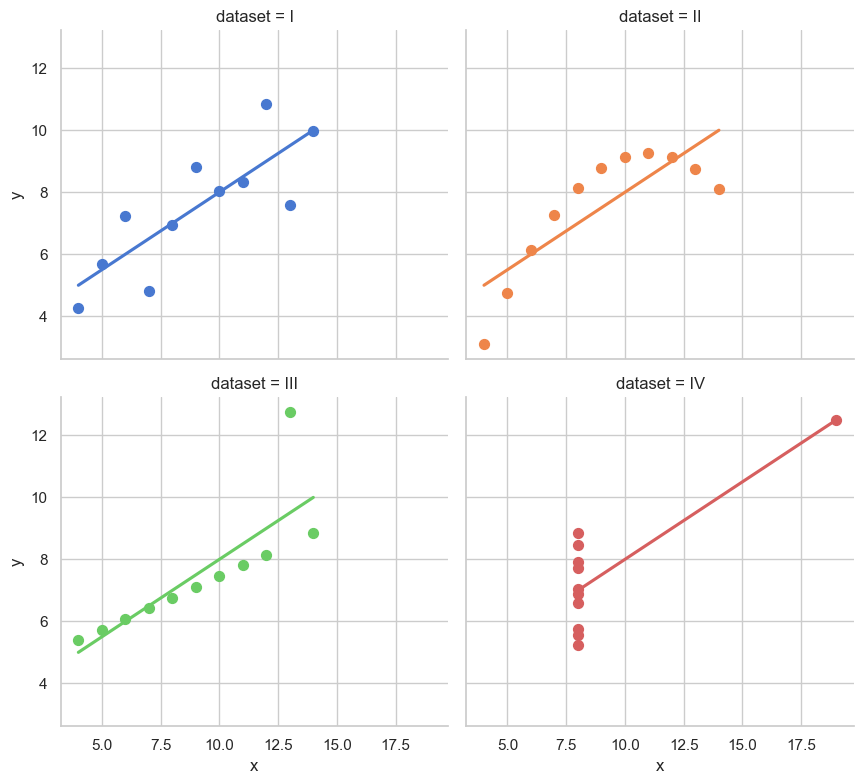

In [65]:
sns.set(style="whitegrid")

g = sns.lmplot(
    x="x", y="y", col="dataset", hue="dataset", data=an,
    col_wrap=2, ci=None, palette="muted",
    scatter_kws={"s": 50, "alpha": 1}, height=4, aspect=1.1
)

plt.tight_layout()
plt.show()

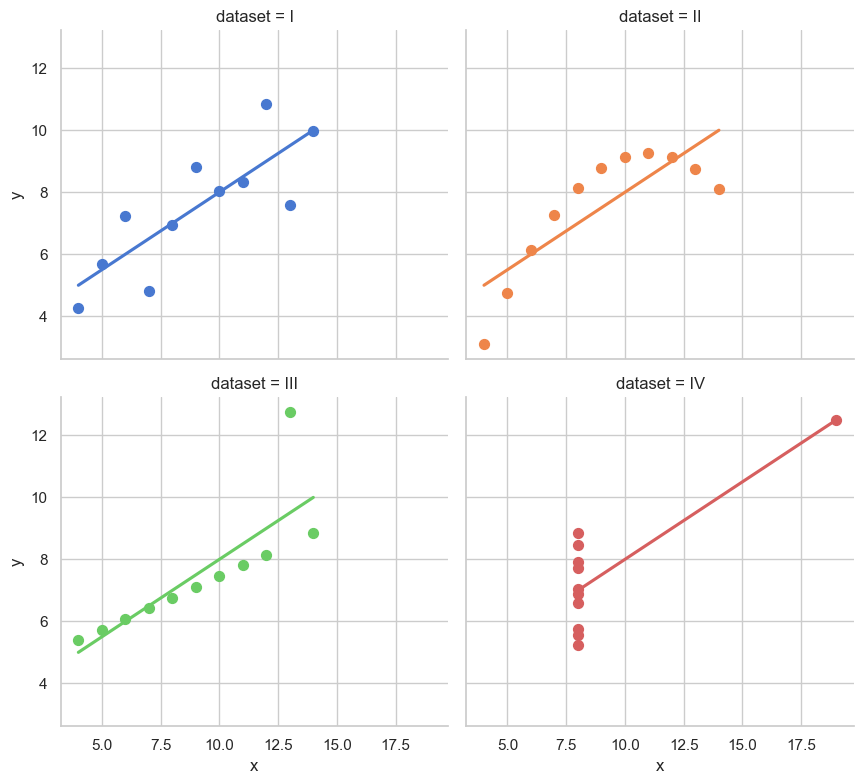

In [66]:
display(g.figure)

* But plotting the data.
* plotting the data will reveal the shape
* they are indeed NOT interchangable
* If this data were driving a business decision, each dataset would suggest starkly different reccomendations.
* Dataset 1 might project growth, dataset 2 shows diminishing returns.
* 3 and 4 have ouliers that could be examined.
* The point is, each has a different story hidden in plain site,
* and withoug visualization, you would never know.
* this is the imporantance of using visualization not to decorate the analysis, but to **drive** it

<div style="text-align:center;">
  <h1 style="font-size: 2em; margin-bottom: 0.2em;">Part 2: Converting data to visual information</h1>
</div>


* Ok you are all convinced.
* Next lets cover what goes into building our very own visualizations.

<div style="text-align:center;">
  <h1 style="font-size: 1.5em; margin-bottom: 0.2em;">The Plot Area</h1>
</div>

<img src="Tax_Graph.jpg" width="1200" style="display: block; margin-left: auto; margin-right: auto;"/>

* the first thing we need is our plot area.
* I get a good kick out of this picture of Ronald Reagan's graph
* But realistically, Considering the audience and medium, I like a lot of the choices.
* Let's talk about what it does right.
* _can anyone find a redeeming quality of this graph?_
* * Each series is labled next to its line.  The font is large and readable
* * series are shown with distinct line patterns
* * there is a shaded polygon that directs attention.
* * Simple color pallet
* * Clean grid area
* yeah that last one is probably where this one jumps the rails.
* we are missing crucial information in the plot area.  
* President Reagan's Graph does a lot of things right, but because it wasnt built with good scaffolding,it is reduced a meme
* The reader needs this context in order to decode the visual information.
* How we lay out our plot area is one of the first crital decsions we make when designing data.

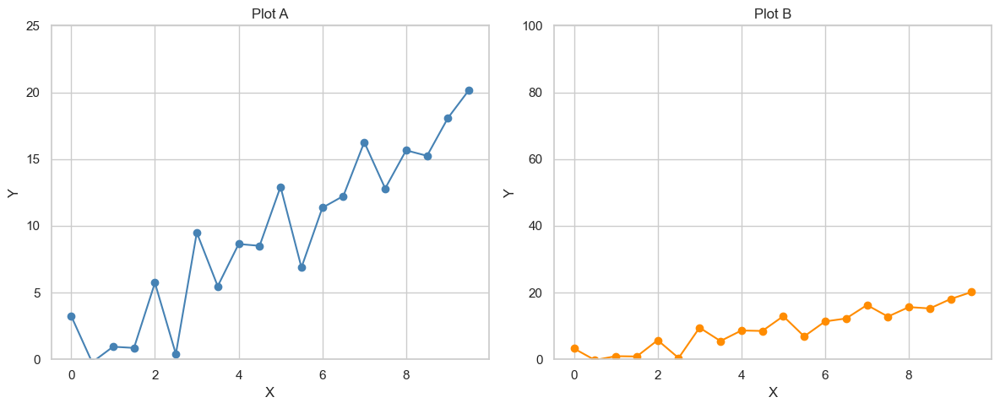

In [67]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

# Set style
sns.set(style="whitegrid")

# Create a simple linear trend with some noise
np.random.seed(1)
x = np.arange(0, 10, 0.5)
y = 2 * x + np.random.normal(0, 2, size=len(x))

# Create subplots with different Y-axis ranges
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

# Plot 1: Tight y-axis range
axs[0].plot(x, y, marker='o', linestyle='-', color='steelblue')
axs[0].set_ylim(0, 25)
axs[0].set_title("Plot A")
axs[0].set_xlabel("X")
axs[0].set_ylabel("Y")

# Plot 2: Wide y-axis range
axs[1].plot(x, y, marker='o', linestyle='-', color='darkorange')
axs[1].set_ylim(0, 100)
axs[1].set_title("Plot B")
axs[1].set_xlabel("X")
axs[1].set_ylabel("Y")

plt.tight_layout()
plt.show()

### Plot Area: Axis and Scale

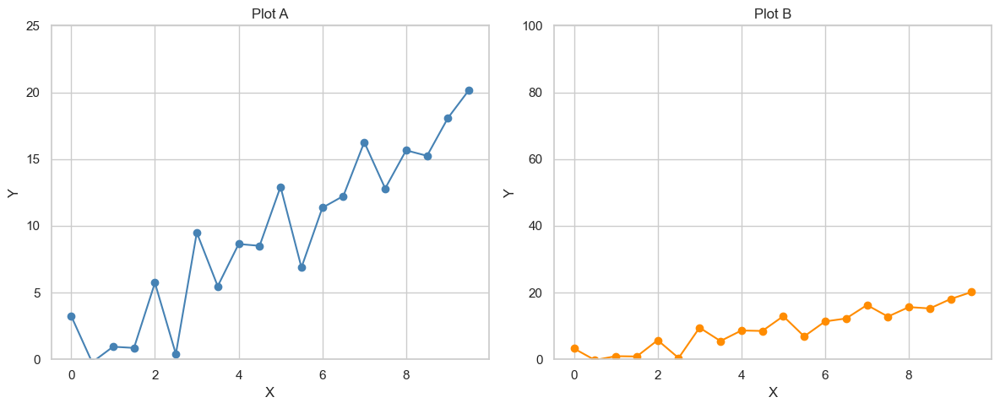

In [68]:
display(fig)

* the way you scale your axis can dramatically change how you represent your data
* **everyone** here knows this right.
* so let me ask you then, which chart would you say is the correctly scaled?
* _repeat if needed until you get engagement._
* everyone agree with that?
* anyone think the other plot is better?
* Its a trick question and everyone wins
* The correct plot depends on what you **need** to analyze.
* plot 1 is better if you need to examine variance within your data.
* Plot 2 is preferred if you are tracking progress toward one hundred.

### Plot Area: Facets

In [69]:
tips = sns.load_dataset("tips")

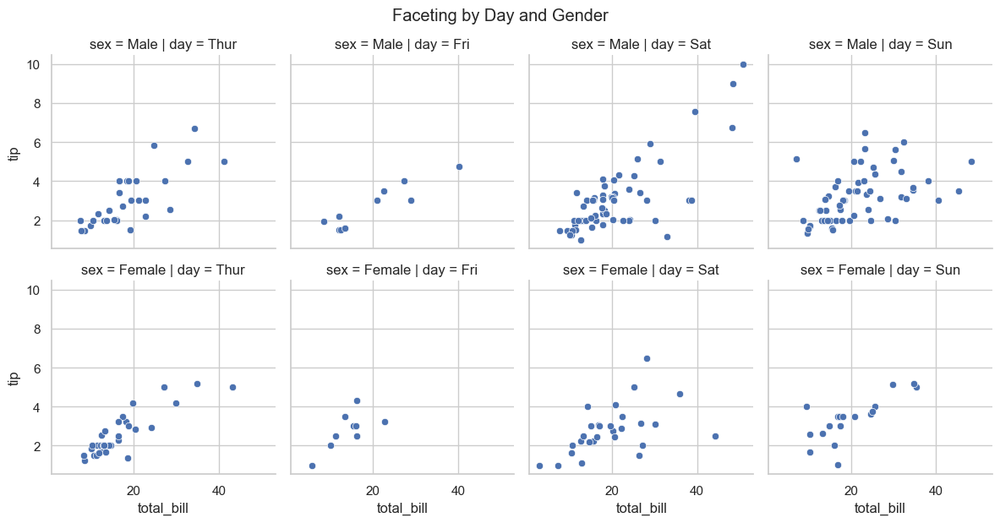

In [70]:
fct = sns.FacetGrid(tips, col="day", row="sex")
fct.map_dataframe(sns.scatterplot, x="total_bill", y="tip")
fct.fig.suptitle("Faceting by Day and Gender", y=1.03)
plt.show()

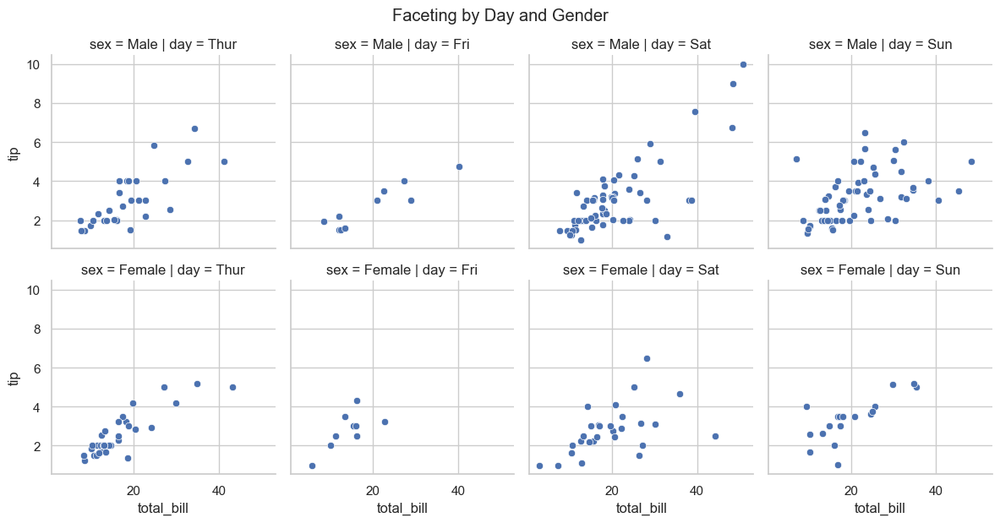

In [71]:
display(fct.figure)

* When exploring data visually, sometimes it makes sense **not** to attempt to plot too many variables in a single graph
* I find facets useful for looking at many variables at once.
* we will talk a litte more about that later.

<div style="text-align:center;">
  <h1 style="font-size: 1.5em; margin-bottom: 0.2em;">Data Transformations</h1>
</div>

<img src="https://i.pinimg.com/originals/eb/3b/42/eb3b42b4bf3915eac2342eb927a7030c.jpg" width="700" style="display: block; margin-left: auto; margin-right: auto;"/>

* We need to consider the data itself.
* Is it ready to be plotted and consumed or do we need to perform transformations.
* Lets look at how different transformations impact our visual analysis.

## Data Transformations: Bin Sizes

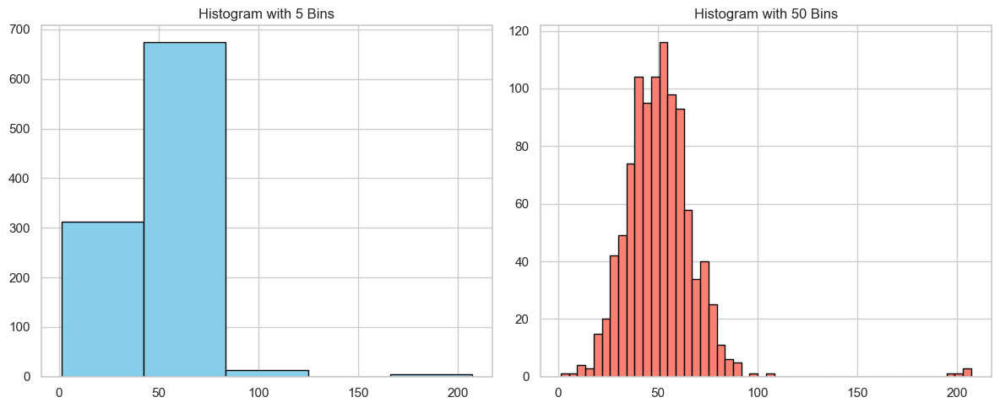

In [72]:
sns.set(style="whitegrid")

# Generate data with outliers
np.random.seed(42)
data = np.random.normal(loc=50, scale=15, size=1000)
data_with_outliers = np.concatenate([data, np.random.normal(loc=200, scale=5, size=5)])

# Plot histograms with different bin sizes
binz, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].hist(data_with_outliers, bins=5, color="skyblue", edgecolor="black")
axs[0].set_title("Histogram with 5 Bins")

axs[1].hist(data_with_outliers, bins=50, color="salmon", edgecolor="black")
axs[1].set_title("Histogram with 50 Bins")

plt.tight_layout()
plt.show()

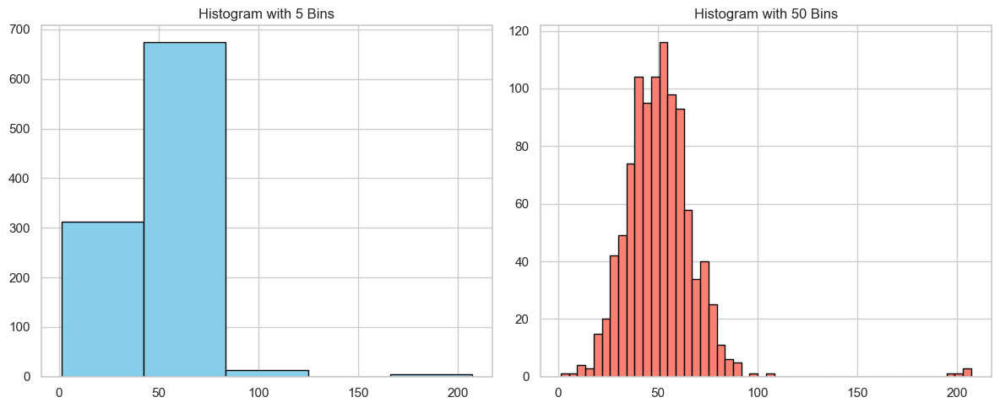

In [73]:
display(binz)

* In this example the impact of changing bin sizes is obvious
* However, the decision on bin size changes base on what the user finds interesting
* Note the large difference in the Y axis of the two historgrams.
* Larger bins let us quickly understand the area under the curve for bins of interest.
* Say we are most interested in the amount of ovservations falling between 40 and 80, 
* with just a glance the chart on the left allows us to find the apporoximate vale of 675.
* meanwhile, we would have to estimate the height of 10 bars and then add them up if we were given the chart on the right.
* Smaller bins allow us to better examine the shape of the distribution which is almost completely obscured by the 5 bin chart.

## Data Transformations: Normalization

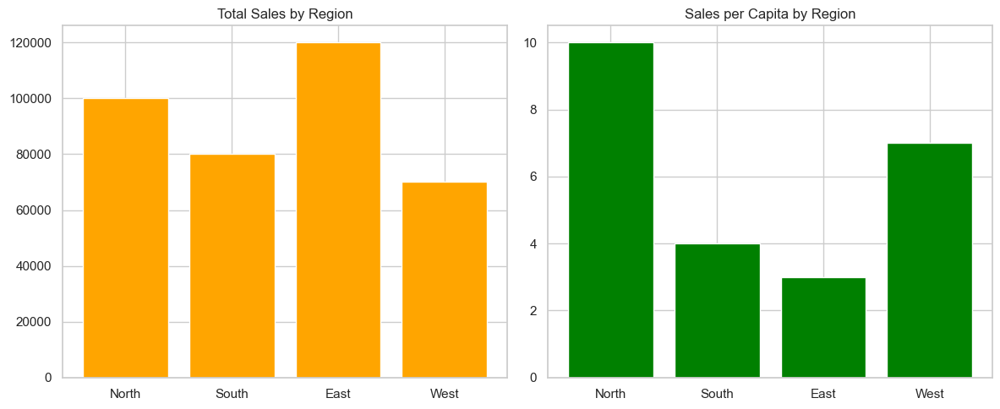

In [74]:
sns.set(style="whitegrid")

# Data for sales and population
regions = ['North', 'South', 'East', 'West']
sales = np.array([100000, 80000, 120000, 70000])
population = np.array([10000, 20000, 40000, 10000])
sales_per_capita = sales / population

# Plot bar charts
norm, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].bar(regions, sales, color="orange")
axs[0].set_title("Total Sales by Region")

axs[1].bar(regions, sales_per_capita, color="green")
axs[1].set_title("Sales per Capita by Region")

plt.tight_layout()
plt.show()

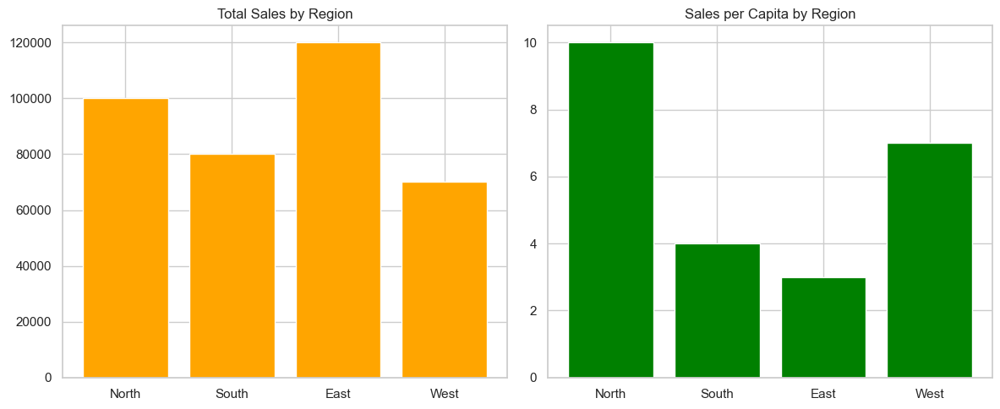

In [75]:
display(norm)

* Normalizing our data allows us to compare across categories.
* An example we are all probably familiar with, is deviding the data by a basesine.
* We are looking at a simple hypothetical example to demonstrate this.
* The chart on the left gives us insight into raw sales by region.
* * glancing at this, we can quickly see that our strongest region is the East.
* On the right chart, adjusting the data to per-capita, we see that we have a winning strategy in the north.
* Comparing these charts side by side
* * we may conclude that there is still a ton of opportunity on the table in the east
* * While the north is strong, we seem pretty satruated.
* * perhaps we could apply some of the tactics from the North to grow in the East.

<div style="text-align:center;">
  <h1 style="font-size: 1.5em; margin-bottom: 0.2em;">Normalization: Real Example</h1>
</div>

<img src="https://www.tucsonsentinel.com/files/entryimages/us-billion-dollar-disasters-by-year.jpg" width="800" style="display: block; margin-left: auto; margin-right: auto;"/>

* This graph shows the number of billion dollar natural disasters in the US over time.
* _is this normalized correctly?_ 
* Whats the first thing to check for in a financial analysis that dates back to the 1980's.
* _is it adjusted for inflation?_
* It is! That is great.
* What is not accounted for?
* _did home price inflation outpace standard inflation?  It didn't did it.  Home prices have beeen skyrocketing_
* _do we have the same amount of residential homes?  We have built millions of new homes._
* So instead of normalizing to inflation, should we should instead normalize to the total value of the residential real estate market?

## Data Transformations Example: Log Transformation

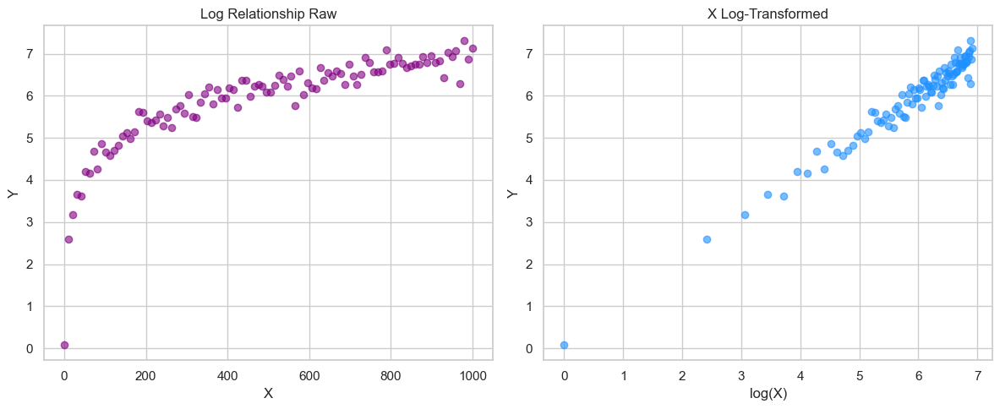

In [76]:
sns.set(style="whitegrid")

# Generate log-related data
x = np.linspace(1, 1000, 100)
y = np.log(x) + np.random.normal(0, 0.2, size=x.shape)

# Plot scatterplots
log, axs = plt.subplots(1, 2, figsize=(12, 5))

axs[0].scatter(x, y, color="purple", alpha=0.6)
axs[0].set_title("Log Relationship Raw")
axs[0].set_xlabel("X")
axs[0].set_ylabel("Y")

axs[1].scatter(np.log(x), y, color="dodgerblue", alpha=0.6)
axs[1].set_title("X Log-Transformed")
axs[1].set_xlabel("log(X)")
axs[1].set_ylabel("Y")

plt.tight_layout()
plt.show()

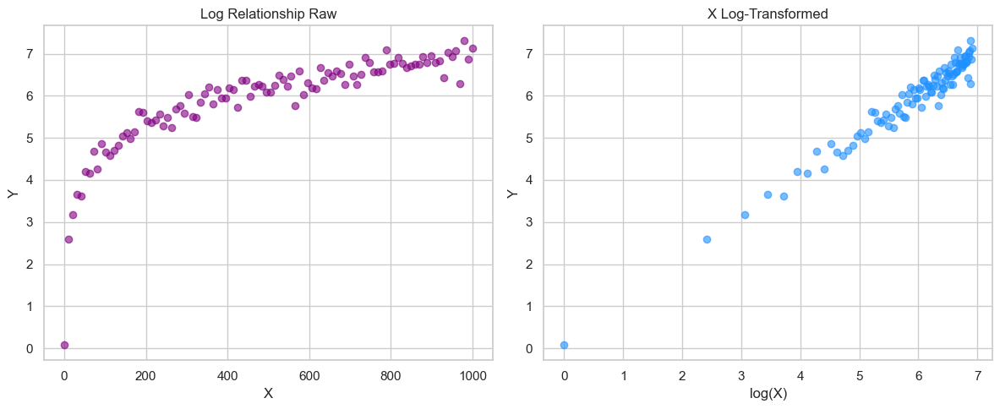

In [77]:
display(log)

* Applying a logarithm function to each value in a dataset is known as "log transforming" data
* Most commonly used is the natural log.
* It looks somehthing like this.

<div style="text-align:center;">
  <h1 style="font-size: 1.5em; margin-bottom: 0.2em;">Data Transformations: Real Example</h1>
</div>

<img src="https://dca-signals.com/wp-content/uploads/2024/02/log-chart-bitcoin-vs-normal-1024x752.jpeg" width="800" style="display: block; margin-left: auto; margin-right: auto;"/>


* This is the price of bitcoin over time.
* The grey line represents the real price, and the gold line shows the Log transformed price.
* Log transforming it allows for better comparison between data-points that differ greatly in magnetude. 

## Marks

* **Points** for scatterplots, dot plots, geographic coordinates
* **Lines** for trends, time series, or continuous flow
* **Bars** for comparing quantities across categories
* **Areas** for showing accumulation or volume
* **Tiles, ribbons, rectangles** - for heatmaps, confidence intervals, density zones


<div style="text-align:center;">
  <h1 style="font-size: 1.5em; margin-bottom: 0.2em;">Encoding</h1>
</div>

<img src="https://i.redd.it/2l7glpm7cjt61.jpg" width="900" style="display: block; margin-left: auto; margin-right: auto;"/>

* who knows what this is?
* thats right, its a morse code machine.
* Its purpose is to encode human speech into dots and dashes that can be transmitted and decoded by a recipient.
* This is an example of encoding.
* * Which is to say, the Tranlsation of information from one format to another
* In data visualization encoding refers to the process of transforming raw data into visual elements that can be easily understood and interpreted by viewers.

## Encoding: Position

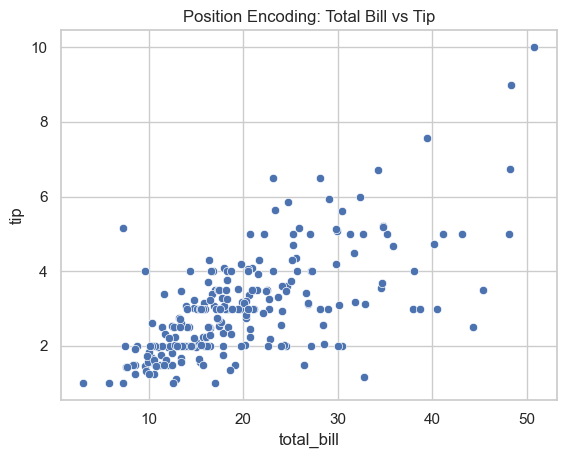

In [78]:
sns.scatterplot(data=tips, x="total_bill", y="tip")
plt.title("Position Encoding: Total Bill vs Tip")
plt.show()

* The next few examples will use the "tips" dataset from the seaborn library.
* It looks at factors that influece the amount of tips left by patrons of a resturant.
* Position is almost always a main element of a data visualitaion.
* the position of the mark in the plot area, tells the veiwer how to interpret the value assigned to it.
* We can compare values quickly to understand relationships and patterns without lingering on the **exact** value of each mark
* and we always can decode any single value as needed.

## Encoding: Color - Discrete

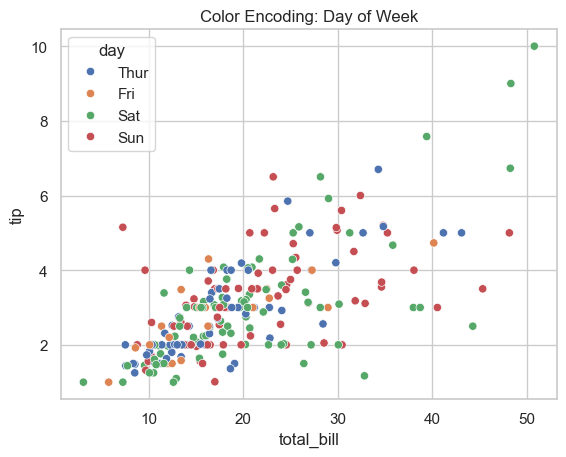

In [79]:
sns.scatterplot(data=tips, x="total_bill", y="tip", hue="day")
plt.title("Color Encoding: Day of Week")
plt.show()

* Not a lot of explanation needed here,
* Color can be useful to help us plot and compare several data series at once.

## Encoding: Color - Continious

In [80]:
con.show()

* _click to view elevation_
* Looking back at our elevation example, it can also represent a contious variable.

## Encoding: Shape

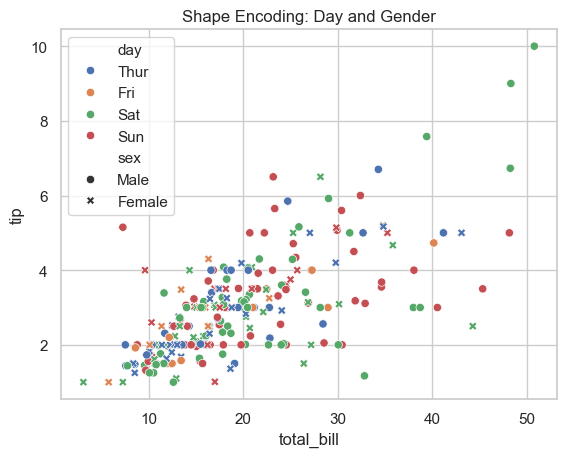

In [81]:
sns.scatterplot(data=tips, x="total_bill", y="tip", hue="day", style="sex")
plt.title("Shape Encoding: Day and Gender")
plt.show()

* shape can be used for comparing yet even more data dimensions.
* use with caution, as you can see, it can sometimes hurt more than it helps.

## Encoding: Size and Volume

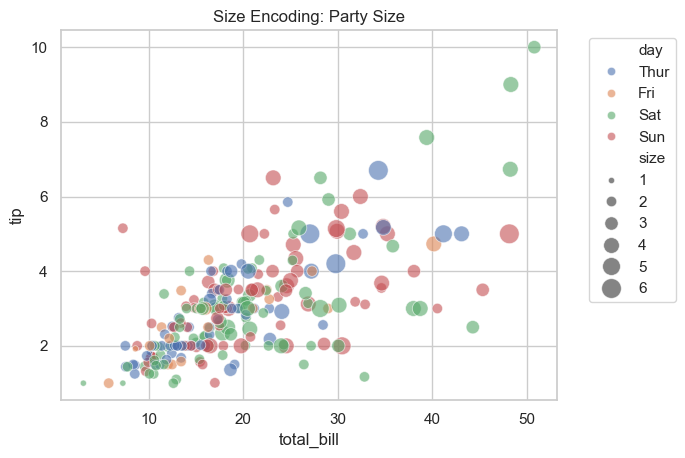

In [82]:
sns.scatterplot(data=tips, x="total_bill", y="tip", size="size", hue="day", sizes=(20, 200), alpha=0.6)
plt.title("Size Encoding: Party Size")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

* Size can aid us in encoding a second continous dimension


<img src="Tax_Graph.jpg" width="1200" style="display: block; margin-left: auto; margin-right: auto;"/>

* Revisiting President Reagan's Polygon,
* It is a mistake to represent the divergence of time series lines with volume encoding.
* _Why?_
* Humans decode shapes as total area
* really what is important here is the vertical distance between lies.

## Encoding: Facets

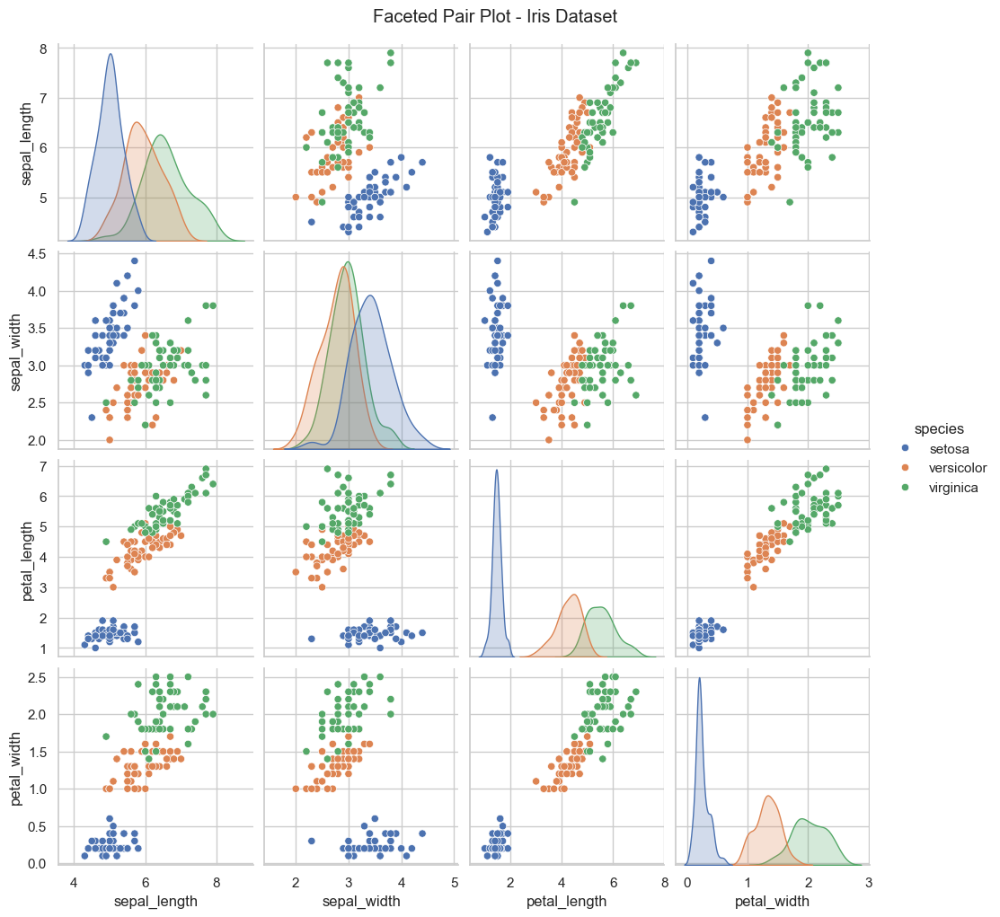

In [83]:
iris = sns.load_dataset("iris")
sns.pairplot(iris, hue="species")
plt.suptitle("Faceted Pair Plot - Iris Dataset", y=1.02)
plt.show()

* If your data have more dimensions than methods for encoding:
* One of my favorite plots for Exploratory Data Analysis is the Pair Plot.
* this allows for a clean comparison of many different relationships between variables
* This one in particular is using the Iris dataset native to seaborn.  
* * Essentially its a dataset about flowers
* It leverages a combination of position, volume and color encoding across facets.
* * Allowing us to orient oursleves quickly to the dataset 
* * and understand any obvious underlying relationships.

### Encoding: Animation

* An encoding technique I rarely use for analysis is animation,
* Although it lends itself to data storytelling more often than analysis it has it's place
* like in this EKG.  Doctors make decsions as based on patterns as they unfold in real time.

<img src="ekg.gif" width="800" style="display: block; margin-left: auto; margin-right: auto;"/>

<img src="https://th.bing.com/th/id/R.809187c911be996403a328a646038415?rik=2P1ZfwqHOsjxUg&riu=http%3a%2f%2fi.cdn.turner.com%2fcnn%2f.element%2fimg%2f3.0%2fweather%2fmaps%2fnxrd_mn_.gif&ehk=CEbwezjDcUxSz0g8W3Rz29e3UUP%2b%2fVeBIrivOayQmIQ%3d&risl=&pid=ImgRaw&r=0" width="1000" style="display: block; margin-left: auto; margin-right: auto;"/>

* another one many of you may be familiar with, is weather forecasting. 
* viewing estimated severity and trajectory of weather helps all of us with our extremely important picnic plans

# Part 3: Examples in Practice

## Setup

In [84]:
# Parameters for the normal distributions
mean1 = 1
std_dev1 = 1
num_samples1 = 1000

mean2 = 2
std_dev2 = 3
num_samples2 = 1000

# Generate the datasets
data1 = np.random.normal(mean1, std_dev1, num_samples1)
data2 = np.random.normal(mean2, std_dev2, num_samples2)

# Create DataFrames from the datasets
df1 = pd.DataFrame(data1, columns=['Value'])
df2 = pd.DataFrame(data2, columns=['Value'])

## Example 1: Evaluate 2 Options

In [85]:
## put the means here and the Pval

## Distributi0ns

In [86]:
import plotly.figure_factory as ff
# Create KDE plot
dis = ff.create_distplot([data1, data2], group_labels=['Distribution 1', 'Distribution 2'], show_hist=False)

# Add vertical lines for means and break-even
dis.add_trace(go.Scatter(x=[mean1, mean1], y=[0, 0.4], mode='lines', name=f'Mean of Distribution 1 ({mean1})', line=dict(color='blue', dash='dash')))
dis.add_trace(go.Scatter(x=[mean2, mean2], y=[0, 0.4], mode='lines', name=f'Mean of Distribution 2 ({mean2})', line=dict(color='orange', dash='dash')))
dis.add_trace(go.Scatter(x=[0, 0], y=[0, 0.4], mode='lines', name='Break-Even', line=dict(color='black', dash='dash')))

# Customize layout
dis.update_layout(title='KDE Plot of Two Normal Distributions', xaxis_title='Value', yaxis_title='Density')
dis.update_layout(height=800)
# Show plot
dis.show()

<img src="Wolf%20Management%20Chart.jpg" width="800" style="display: block; margin-left: auto; margin-right: auto;"/>
<img src="Wolf Quote.jpg" width="800" style="display: block; margin-left: auto; margin-right: auto;"/>

<div style="text-align:center;">
  <h1 style="font-size: 1.5em; margin-bottom: 0.2em;">Part 3: Applied Knowlege</h1>
</div>

<img src="Wolf%20Management%20Chart.jpg" width="900" style="display: block; margin-left: auto; margin-right: auto;"/>
<img src="Wolf Quote.jpg" width="600" style="display: block; margin-left: auto; margin-right: auto;"/>


* Using what we covered, let's do an exercise. 
* _starting with the plot area, what do you notice?_
* * Dual axis, different scales.
* * On the x axis, we can see the author chose a time series
* * considering this analysis should be aimed at understading the relationship of the two populations, our visual should instead be built to identify correlation instead of trend.
* _next lets look at data transformations_
* This chart attempts to make a comparison between deer normalized by square mile and absolute wolf population.
* Transforming it in this way does not contribute to our comprehention of the relationship we seek to explore.
* _marks_
* Redundant marks - points and lines
* _moving on to encoding_
* Each series is double encoded as color and shape.

In [93]:
wd = pd.read_csv('Wolf_Density.csv')

In [94]:
wd.head()

,Year,Wolf Range Sq Mi,Wolf Pop,Wolf Density,Deer Density
0,2010,16553.21314,2100,0.126864,10.050000
1,2011,16553.21314,2200,0.132905,10.000000
2,2012,24372.97372,2211,0.090715,11.764706
3,2013,25562.83812,2423,0.094786,11.527778
4,2014,25562.83812,2221,0.086884,9.666667


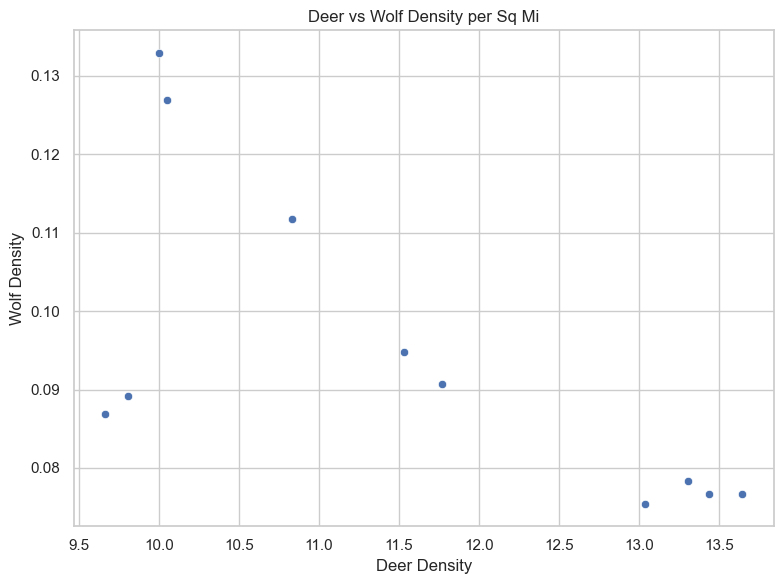

In [127]:
wolf = plt.figure(figsize=(8, 6))
sns.scatterplot(data=wd, x="Deer Density", y="Wolf Density")
plt.title("Deer vs Wolf Density per Sq Mi")
plt.xlabel("Deer Density")
plt.ylabel("Wolf Density")
plt.tight_layout()
plt.show()

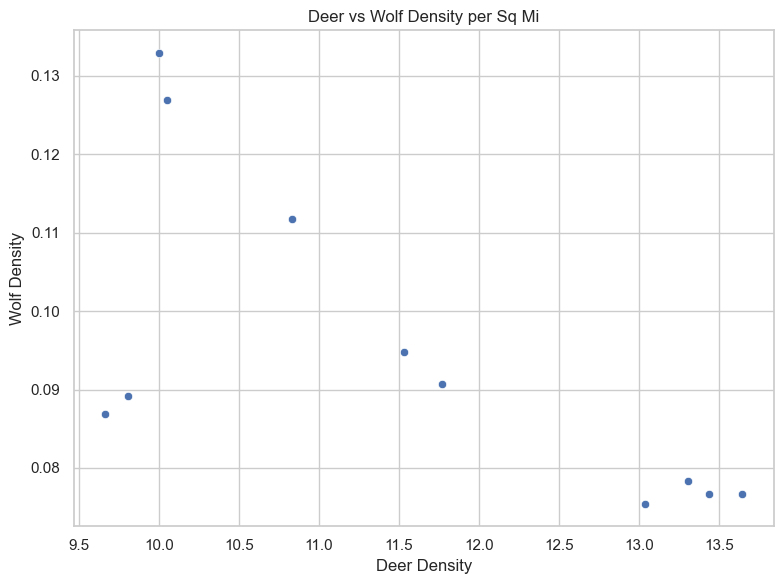

In [128]:
display(wolf.figure)

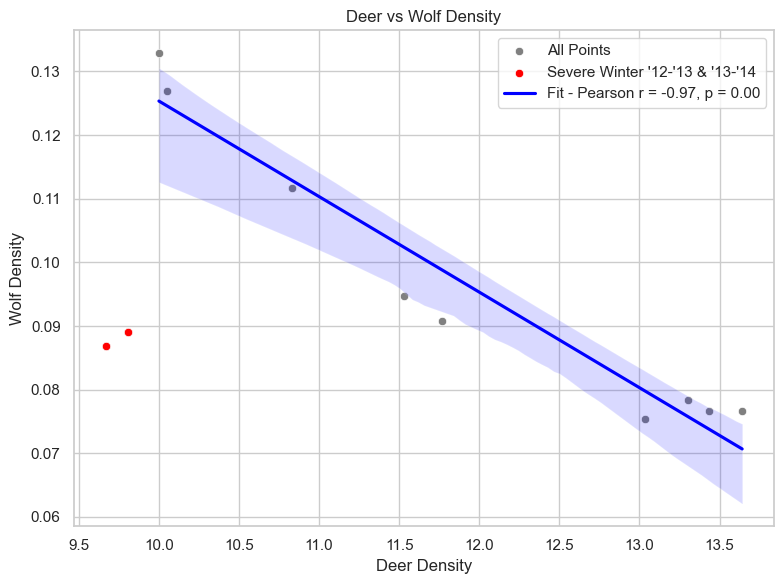

In [132]:
wd_sorted = wd.sort_values(by="Deer Density")
excluded = wd_sorted.head(2)
included = wd_sorted.iloc[2:]

final_wolf = plt.figure(figsize=(8, 6))

sns.scatterplot(data=wd, x='Deer Density', y='Wolf Density', color='gray', label='All Points')

sns.scatterplot(data=excluded, x='Deer Density', y='Wolf Density', color='red', label="Severe Winter '12-'13 & '13-'14")

sns.regplot(data=included, x='Deer Density', y='Wolf Density', scatter=False, color='blue', label=f"Fit - Pearson r = {r:.2f}, p = {p:.2f}")

r, p = pearsonr(included['Wolf Density'], included['Deer Density'])
plt.title(f"Deer vs Wolf Density")
plt.legend()
plt.tight_layout()
plt.show()

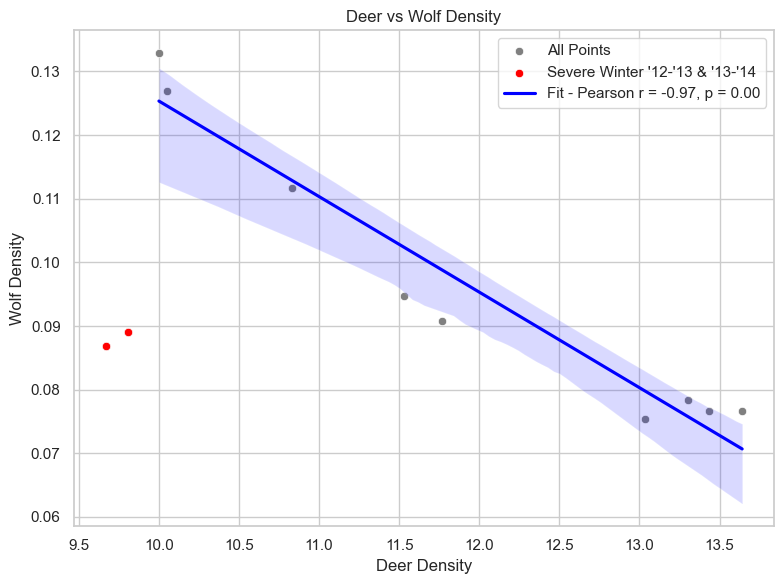

In [133]:
display(final_wolf.figure)